In [1]:
!pip install ultralytics opencv-python matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 31.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 39.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 18.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 86.4 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

In [ ]:

!pip  install -q timm

In [3]:
!pip install -q ultralytics timm opencv-python matplotlib

In [ ]:

!pip install -q gdown
!gdown --id 1t5YDg4_X97edTd0q-i82UdhapIgsM1pP -O /content/MergedYOLO.zip
!unzip -o /content/MergedYOLO.zip -d /content/

Streaming output truncated to the last 5000 lines.
  inflating: /content/images/WEB03811.jpg  
  inflating: /content/images/WEB08539.jpg  
  inflating: /content/images/WEB08924.jpg  
  inflating: /content/images/WEB08191.jpg  
  inflating: /content/images/AoF06528.jpg  
  inflating: /content/images/PublicDataset00418.jpg  
  inflating: /content/images/WEB04046.jpg  
  inflating: /content/images/nonfire_2749.jpg  
  inflating: /content/images/WEB05474.jpg  
  inflating: /content/images/nonfire_0889.jpg  
  inflating: /content/images/WEB03795.jpg  
  inflating: /content/images/nonfire_1761.jpg  
  inflating: /content/images/nonfire_1384.jpg  
  inflating: /content/images/nonfire_1317.jpg  
  inflating: /content/images/nonfire_2393.jpg  
  inflating: /content/images/WEB08832.jpg  
  inflating: /content/images/nonfire_0171.jpg  
  inflating: /content/images/WEB08702.jpg  
  inflating: /content/images/WEB05644.jpg  
  inflating: /content/images/WEB04614.jpg  
  inflating: /content/images/Pu

split dataset to create train, test and validation pairs

In [ ]:
import os, random, shutil, textwrap
from glob import glob

IMG_SRC = "/content/images"
LBL_SRC = "/content/labels"
DEST_ROOT = "/content/dataset"

for s in ["train", "val", "test"]:
    os.makedirs(f"{DEST_ROOT}/images/{s}", exist_ok=True)
    os.makedirs(f"{DEST_ROOT}/labels/{s}", exist_ok=True)

img_paths = []
for img_path in glob(f"{IMG_SRC}/*.*"):
    base = os.path.splitext(os.path.basename(img_path))[0]
    lbl_path = f"{LBL_SRC}/{base}.txt"
    if os.path.exists(lbl_path) and os.path.getsize(lbl_path) > 0:
        with open(lbl_path) as f:
            lines = [line.strip() for line in f if line.strip()]
            if lines:
                img_paths.append(img_path)

random.seed(42)
random.shuffle(img_paths)

n = len(img_paths)
n_train = int(0.8 * n)
n_val = int(0.1 * n)
splits_dict = {
    "train": img_paths[:n_train],
    "val"  : img_paths[n_train:n_train + n_val],
    "test" : img_paths[n_train + n_val:]
}

for split, paths in splits_dict.items():
    for img in paths:
        base = os.path.basename(img)
        lbl = f"{LBL_SRC}/{os.path.splitext(base)[0]}.txt"
        shutil.copy(img, f"{DEST_ROOT}/images/{split}/{base}")
        shutil.copy(lbl, f"{DEST_ROOT}/labels/{split}/{os.path.basename(lbl)}")

yaml_text = textwrap.dedent(f"""
path: {DEST_ROOT}
train: images/train
val: images/val
test: images/test
nc: 3
names: [fire, smoke, nonfire]
""").strip()

with open("/content/fire_smoke.yaml", "w") as f:
    f.write(yaml_text)

print(" Dataset split complete!")
print("Train images:", len(splits_dict['train']))
print("Val images:", len(splits_dict['val']))
print("Test images:", len(splits_dict['test']))


 Dataset split complete!
Train images: 7200
Val images: 900
Test images: 900


stage A training

In [ ]:
from ultralytics import YOLO
from ultralytics.nn.modules import Detect
import timm, torch
import shutil

model = YOLO("/content/bestyolo.pt")

effvit = timm.create_model(
    "efficientvit_b0.r224_in1k",
    pretrained=True,
    features_only=True,
    out_indices=(1, 2, 3)
)

new_head = Detect(
    nc=3,
    ch=effvit.feature_info.channels()
)

model.model.model[0] = effvit
model.model.model[-1] = new_head

for p in model.model.parameters():
    p.requires_grad = True

print(" EfficientViT backbone plugged in and full model ready for training!")

results_A = model.train(
    data="/content/fire_smoke.yaml",
    imgsz=224,
    epochs=20,
    batch=8,
    lr0=3e-4,
    device="cuda" if torch.cuda.is_available() else "cpu",
    workers=2,
    project="runs/detect",
    name="A_EfficientViT_from_bestyolo",
    verbose=True
)

final_stageA_path = "runs/detect/A_EfficientViT_from_bestyolo/weights/best.pt"
save_path = "/content/yolo_stageA_efficientvit_bestyolo.pt"
shutil.copy(final_stageA_path, save_path)
print(f" Final Stage A model saved to {save_path}")


✅ EfficientViT backbone plugged in and full model ready for training!
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/fire_smoke.yaml, degrees=0.0, deterministic=True, device=cuda:0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0003, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/bestyolo.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=A_EfficientViT_from_bestyolo3, nbs=64, nms=False, opset=None, optimize=Fal

train: Scanning /content/dataset/labels/train... 7200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7200/7200 [00:05<00:00, 1402.74it/s]

train: /content/dataset/images/train/WEB07199.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07297.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07305.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07536.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07540.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07541.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07543.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07554.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07555.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07556.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07559.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07561.jpg: corrupt JPEG restored and saved


train: New cache created: /content/dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 673.9±466.4 MB/s, size: 67.1 KB)


val: Scanning /content/dataset/labels/val... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<00:00, 1513.10it/s]

val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07278.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07557.jpg: corrupt JPEG restored and saved
val: New cache created: /content/dataset/labels/val.cache


Plotting labels to runs/detect/A_EfficientViT_from_bestyolo3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0003' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 224 train, 224 val
Using 2 dataloader workers
Logging results to runs/detect/A_EfficientViT_from_bestyolo3
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20     0.475G      1.845      53.56      2.555         47        224: 100%|██████████| 900/900 [01:38<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:09<00:00,  6.10it/s]


                   all        900       1644      0.336      0.472       0.43      0.316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20     0.568G      1.196      2.066       1.56         33        224: 100%|██████████| 900/900 [01:41<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.99it/s]


                   all        900       1644       0.59      0.556      0.556      0.417

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20     0.568G      1.096      1.289       1.43         25        224: 100%|██████████| 900/900 [01:47<00:00,  8.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.49it/s]


                   all        900       1644      0.637      0.562      0.601      0.434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20     0.568G      1.038      1.157      1.371         42        224: 100%|██████████| 900/900 [01:47<00:00,  8.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.06it/s]

                   all        900       1644      0.611      0.601       0.62      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20     0.568G     0.9857      1.068      1.328         37        224: 100%|██████████| 900/900 [01:31<00:00,  9.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.16it/s]

                   all        900       1644      0.716      0.603      0.639      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20     0.619G     0.9489      1.018      1.296         29        224: 100%|██████████| 900/900 [01:33<00:00,  9.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.46it/s]

                   all        900       1644      0.599      0.653       0.67      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20     0.619G     0.9219     0.9532      1.275         29        224: 100%|██████████| 900/900 [01:30<00:00,  9.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.29it/s]

                   all        900       1644      0.706      0.652       0.67      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20     0.619G     0.9097     0.9297      1.262         25        224: 100%|██████████| 900/900 [01:30<00:00,  9.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00,  9.54it/s]

                   all        900       1644      0.672      0.646      0.685      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20     0.674G     0.8815     0.8942      1.243         24        224: 100%|██████████| 900/900 [01:29<00:00, 10.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.44it/s]


                   all        900       1644      0.701      0.644      0.687      0.501

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20     0.729G     0.8696     0.8636      1.229         22        224: 100%|██████████| 900/900 [01:30<00:00,  9.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.39it/s]

                   all        900       1644      0.734      0.655      0.694      0.502


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20     0.729G     0.9512     0.8248      1.265         17        224: 100%|██████████| 900/900 [01:30<00:00,  9.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00,  9.67it/s]

                   all        900       1644      0.724      0.675      0.691      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20     0.729G     0.9327     0.7775      1.248         11        224: 100%|██████████| 900/900 [01:27<00:00, 10.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.42it/s]

                   all        900       1644      0.749      0.662      0.695      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20     0.729G     0.9097     0.7539      1.222          8        224: 100%|██████████| 900/900 [01:28<00:00, 10.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  9.04it/s]

                   all        900       1644      0.745      0.682      0.713      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20     0.729G     0.9049     0.7268       1.22         13        224: 100%|██████████| 900/900 [01:29<00:00, 10.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.14it/s]

                   all        900       1644      0.756      0.682      0.716      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20     0.729G     0.8887     0.6938      1.204         13        224: 100%|██████████| 900/900 [01:29<00:00, 10.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.67it/s]

                   all        900       1644      0.761      0.683      0.713      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20     0.748G     0.8754     0.6789      1.199         16        224: 100%|██████████| 900/900 [01:27<00:00, 10.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.49it/s]

                   all        900       1644      0.749      0.704      0.725      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20     0.748G     0.8574     0.6576      1.186         14        224: 100%|██████████| 900/900 [01:26<00:00, 10.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.74it/s]

                   all        900       1644      0.769      0.701       0.73      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20     0.748G     0.8453     0.6419      1.181         16        224: 100%|██████████| 900/900 [01:27<00:00, 10.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.42it/s]

                   all        900       1644      0.771      0.695       0.73       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20     0.748G     0.8383     0.6232      1.167          8        224: 100%|██████████| 900/900 [01:29<00:00, 10.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.50it/s]

                   all        900       1644      0.797      0.704      0.741      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20     0.748G     0.8189     0.6058      1.156         15        224: 100%|██████████| 900/900 [01:28<00:00, 10.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.44it/s]

                   all        900       1644      0.772      0.709      0.742      0.557



20 epochs completed in 0.551 hours.
Optimizer stripped from runs/detect/A_EfficientViT_from_bestyolo3/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/A_EfficientViT_from_bestyolo3/weights/best.pt, 22.5MB

Validating runs/detect/A_EfficientViT_from_bestyolo3/weights/best.pt...
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.97it/s]


                   all        900       1644      0.773      0.709      0.742      0.557
                  fire        528        571      0.736      0.695       0.75      0.451
                 smoke        309        767      0.621      0.438      0.482      0.227
               nonfire        306        306      0.962      0.993      0.994      0.994
Speed: 0.1ms preprocess, 1.2ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/A_EfficientViT_from_bestyolo3
 Final Stage A model saved to /content/yolo_stageA_efficientvit_bestyolo.pt


stage A metrics

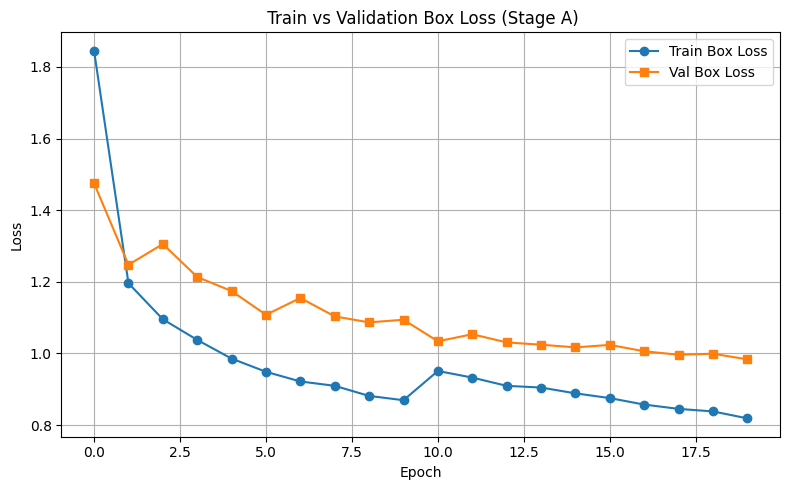

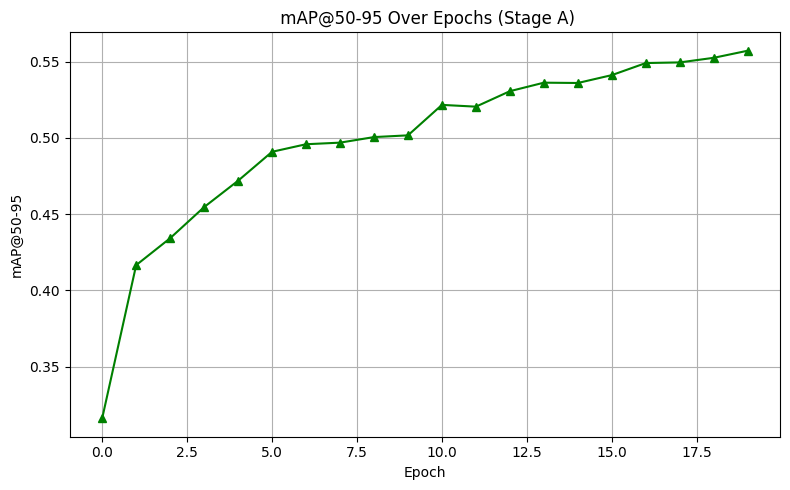

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("/content/runs/detect/A_EfficientViT_from_bestyolo3/results.csv")
df.columns = df.columns.str.strip()  

plt.figure(figsize=(8, 5))
plt.plot(df["train/box_loss"], label="Train Box Loss", marker='o')
plt.plot(df["val/box_loss"], label="Val Box Loss", marker='s')
plt.title(" Train vs Validation Box Loss (Stage A)")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(df["metrics/mAP50-95(B)"], marker='^', color='green')
plt.title(" mAP@50-95 Over Epochs (Stage A)")
plt.xlabel("Epoch")
plt.ylabel("mAP@50-95")
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
pip install -U sympy==1.12

stage B training

In [ ]:
import os, random, torch, torch.nn as nn, torchvision
from glob import glob
from ultralytics import YOLO
from transformers import AutoTokenizer, AutoModel
from torchvision.transforms.functional import resize
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"

model_A = YOLO("/content/yolo_stageA_efficientvit_bestyolo.pt")
vit = model_A.model.model[0].eval().to(device)
for p in vit.parameters():
    p.requires_grad = False

proj = nn.Linear(32, 384, bias=False).to(device)

tok = AutoTokenizer.from_pretrained("sentence-transformers/all-MiniLM-L6-v2")
txtEnc = AutoModel.from_pretrained("sentence-transformers/all-MiniLM-L6-v2").eval().to(device)

@torch.no_grad()
def txt_embed(sentences):
    t = tok(sentences, padding=True, return_tensors="pt").to(device)
    z = txtEnc(**t).last_hidden_state[:, 0]
    return nn.functional.normalize(z, dim=-1)

idx2cap = {0: "blazing fire", 1: "rising smoke", 2: "scene with no fire"}

def img_embed(imgs):
    with torch.no_grad():
        f = vit(imgs)[-1]
        pooled = f.mean((-2, -1))
    vec = proj(pooled)
    return nn.functional.normalize(vec, dim=-1)

IMG_DIR, LBL_DIR = "/content/images", "/content/labels"
paths = [p for p in glob(f"{IMG_DIR}/*.*") if os.path.exists(f"{LBL_DIR}/{os.path.splitext(os.path.basename(p))[0]}.txt")]
random.shuffle(paths)

def data_iter(batch=32):
    for i in range(0, len(paths), batch):
        imgs, caps = []
        for p in paths[i:i+batch]:
            try:
                img = torchvision.io.read_image(p)
                if img.ndim != 3 or img.shape[0] != 3:
                    continue
                img = img[:3] / 255.0
                img = resize(img, [224, 224])
                cls = int(open(f"{LBL_DIR}/{os.path.splitext(os.path.basename(p))[0]}.txt").read().split()[0])
                imgs.append(img)
                caps.append(idx2cap[cls])
            except:
                continue
        if len(imgs) > 1:
            yield torch.stack(imgs).to(device), caps

base_lr = 3e-3
opt = torch.optim.AdamW(proj.parameters(), lr=base_lr, weight_decay=1e-4)
nll, loss_hist = nn.NLLLoss(), []
epochs, T = 20, 0.07

for ep in range(epochs):
    tot, seen = 0.0, 0
    for imgs, caps in data_iter():
        ie = img_embed(imgs)
        te = txt_embed(caps)
        sim = ie @ te.T / T
        labels = torch.arange(sim.size(0), device=device)
        loss = nll(torch.log_softmax(sim, dim=-1), labels)
        opt.zero_grad()
        loss.backward()
        opt.step()
        tot  += loss.item() * imgs.size(0)
        seen += imgs.size(0)
    avg = tot / seen
    loss_hist.append(avg)
    print(f"Epoch {ep+1:02d}/{epochs}  loss {avg:.4f}  lr {opt.param_groups[0]['lr']:.5f}")


Skipping bad image: /content/images/WEB03687.jpg with shape torch.Size([4, 388, 764])
Skipping bad image: /content/images/WEB07187.jpg with shape torch.Size([4, 352, 632])
Skipping bad image: /content/images/WEB07975.jpg with shape torch.Size([4, 460, 700])
Skipping bad image: /content/images/WEB03690.jpg with shape torch.Size([4, 380, 756])
Skipping bad image: /content/images/WEB04238.jpg with shape torch.Size([4, 469, 630])
Skipping bad image: /content/images/WEB09118.jpg with shape torch.Size([4, 520, 700])
Skipping bad image: /content/images/nonfire_1335.jpg with shape torch.Size([19, 3, 304, 540])
Skipping bad image: /content/images/WEB07420.jpg with shape torch.Size([4, 377, 757])
Skipping bad image: /content/images/WEB04978.jpg with shape torch.Size([4, 380, 620])
Skipping bad image: /content/images/nonfire_0103.jpg with shape torch.Size([4, 416, 627])
Skipping bad image: /content/images/WEB07324.jpg with shape torch.Size([4, 354, 631])
Skipping bad image: /content/images/WEB074

stage B metrics

✓ TorchScript projector saved  →  /content/efficientvit_stageB/projector_384D_stageB.pt
✓ Loss history saved           →  /content/efficientvit_stageB/loss_history.csv


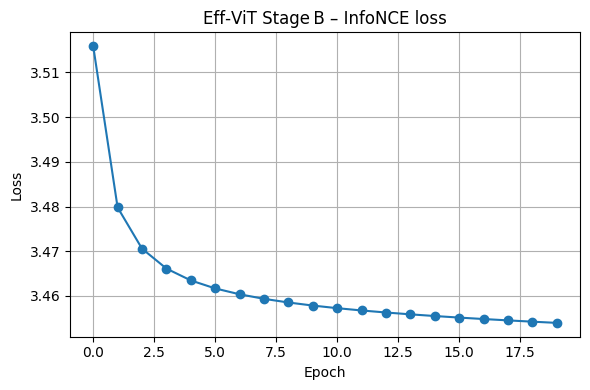

✓ Loss curve saved             →  /content/efficientvit_stageB/loss_curve.png


In [ ]:
class ProjectorWrapper(nn.Module):
    def __init__(self, linear_proj):
        super().__init__()
        self.proj = linear_proj

    def forward(self, x):
        x = self.proj(x)
        return torch.nn.functional.normalize(x, dim=-1)

wrapper = ProjectorWrapper(proj).to(device).eval()

dummy = torch.randn(1, proj.in_features, device=device)
scripted_proj = torch.jit.trace(wrapper, dummy)

save_dir = "/content/efficientvit_stageB"
os.makedirs(save_dir, exist_ok=True)

pt_path   = os.path.join(save_dir, "projector_384D_stageB.pt")
csv_path  = os.path.join(save_dir, "loss_history.csv")
png_path  = os.path.join(save_dir, "loss_curve.png")

scripted_proj.save(pt_path)
print(f"✓ TorchScript projector saved  →  {pt_path}")

with open(csv_path, "w") as f:
    f.write("epoch,loss\n")
    for i, v in enumerate(loss_hist, 1):
        f.write(f"{i},{v:.6f}\n")
print(f"✓ Loss history saved           →  {csv_path}")

plt.figure(figsize=(6,4))
plt.plot(loss_hist, marker='o')
plt.title("Eff‑ViT Stage B – InfoNCE loss")
plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.grid(True)
plt.tight_layout(); plt.savefig(png_path, dpi=120)
plt.show()
print(f"✓ Loss curve saved             →  {png_path}")


stage C training

In [ ]:
import torch, shutil, matplotlib.pyplot as plt
from ultralytics import YOLO
import torch.nn as nn

device = "cuda" if torch.cuda.is_available() else "cpu"
stageA_ckpt = "/content/yolo_stageA_efficientvit_bestyolo.pt"
model_C     = YOLO(stageA_ckpt)

for p in model_C.model.model[0].parameters():
    p.requires_grad = False

proj = nn.Linear(32, 384, bias=False)
proj.load_state_dict(torch.load("/content/projector_efficientvit_stageB_384D.pth"))
proj.eval().to(device)
for p in proj.parameters():
    p.requires_grad = False

for name, p in model_C.model.named_parameters():
    if "model.0" in name:
        p.requires_grad = False
    else:
        p.requires_grad = True

results_C = model_C.train(
    data="/content/fire_smoke.yaml",
    imgsz=224,
    epochs=20,
    batch=8,
    lr0=1e-3,
    device=device,
    workers=2,
    project="runs/detect",
    name="C_EffViT_head_only",
    verbose=True
)

metrics = results_C.csv()
print(metrics[["epoch","train/box_loss","metrics/mAP50-95"]])

plt.figure(figsize=(5,4))
plt.plot(metrics["epoch"], metrics["train/box_loss"], label="train box")
plt.plot(metrics["epoch"], metrics["val/box_loss"], label="val box")
plt.title("Stage C — Loss"); plt.xlabel("epoch"); plt.ylabel("loss"); plt.legend(); plt.grid()
plt.tight_layout(); plt.show()

plt.figure(figsize=(5,4))
plt.plot(metrics["epoch"], metrics["metrics/mAP50-95"], marker='o')
plt.title("Stage C — mAP@50‑95"); plt.xlabel("epoch"); plt.ylabel("mAP"); plt.grid()
plt.tight_layout(); plt.show()

best_c = results_C.save_dir / "weights" / "best.pt"
final_path = "/content/yolo_stageC_efficientvit_head.pt"
shutil.copy(best_c, final_path)
print("✓  Stage C model saved →", final_path)


Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/fire_smoke.yaml, degrees=0.0, deterministic=True, device=cuda:0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/yolo_stageA_efficientvit_bestyolo.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=C_EffViT_head_only2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, per

train: Scanning /content/dataset/labels/train.cache... 7200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7200/7200 [00:00<?, ?it/s]

train: /content/dataset/images/train/WEB07199.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07297.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07305.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07536.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07540.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07541.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07543.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07554.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07555.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07556.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07559.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07561.jpg: corrupt JPEG restored and saved


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 357.0±121.5 MB/s, size: 67.1 KB)


val: Scanning /content/dataset/labels/val.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07278.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07557.jpg: corrupt JPEG restored and saved


Plotting labels to runs/detect/C_EffViT_head_only2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 224 train, 224 val
Using 2 dataloader workers
Logging results to runs/detect/C_EffViT_head_only2
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      1.05G       3.31      3.457      3.341         47        224: 100%|██████████| 900/900 [01:41<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:08<00:00,  6.56it/s]

                   all        900       1644      0.258      0.178      0.231      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      1.12G       2.62      2.794      2.622         33        224: 100%|██████████| 900/900 [01:37<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.02it/s]

                   all        900       1644     0.0824      0.153     0.0688      0.031



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20       1.2G      2.282      2.535      2.346         25        224: 100%|██████████| 900/900 [01:34<00:00,  9.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:07<00:00,  7.99it/s]

                   all        900       1644      0.139      0.194      0.103      0.041



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      1.25G      1.988      2.191      2.091         42        224: 100%|██████████| 900/900 [01:32<00:00,  9.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00,  9.66it/s]

                   all        900       1644      0.733      0.277      0.315      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      1.25G      1.723       1.89      1.882         37        224: 100%|██████████| 900/900 [01:35<00:00,  9.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.77it/s]

                   all        900       1644       0.51      0.356      0.383      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      1.25G      1.542      1.701      1.728         29        224: 100%|██████████| 900/900 [01:32<00:00,  9.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  9.08it/s]

                   all        900       1644      0.673      0.361      0.376      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      1.25G      1.437      1.586      1.651         29        224: 100%|██████████| 900/900 [01:33<00:00,  9.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.30it/s]


                   all        900       1644       0.34      0.449        0.4      0.242

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      1.25G      1.367      1.523      1.585         25        224: 100%|██████████| 900/900 [01:32<00:00,  9.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.49it/s]

                   all        900       1644      0.432      0.445       0.41      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      1.25G      1.288      1.442      1.521         24        224: 100%|██████████| 900/900 [01:32<00:00,  9.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00,  9.62it/s]


                   all        900       1644      0.491      0.486      0.472      0.323

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      1.25G      1.251      1.393      1.479         22        224: 100%|██████████| 900/900 [01:35<00:00,  9.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:07<00:00,  7.77it/s]


                   all        900       1644      0.535      0.476      0.477      0.332
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      1.25G      1.259      1.324      1.484         17        224: 100%|██████████| 900/900 [01:36<00:00,  9.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:07<00:00,  7.60it/s]


                   all        900       1644        0.5      0.519      0.491      0.364

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      1.25G      1.195      1.206      1.429         11        224: 100%|██████████| 900/900 [01:38<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:07<00:00,  7.82it/s]

                   all        900       1644      0.543      0.528      0.509      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      1.25G       1.17      1.188      1.399          8        224: 100%|██████████| 900/900 [01:31<00:00,  9.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00,  9.79it/s]

                   all        900       1644      0.539      0.527      0.516      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      1.25G      1.152      1.147      1.389         13        224: 100%|██████████| 900/900 [01:32<00:00,  9.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  9.13it/s]

                   all        900       1644       0.59      0.534      0.528      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      1.25G      1.129      1.107      1.374         13        224: 100%|██████████| 900/900 [01:31<00:00,  9.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.45it/s]


                   all        900       1644      0.553      0.533      0.536      0.389

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      1.25G      1.116      1.097       1.37         16        224: 100%|██████████| 900/900 [01:31<00:00,  9.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.35it/s]

                   all        900       1644      0.559      0.552      0.538      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      1.25G      1.101       1.07      1.351         14        224: 100%|██████████| 900/900 [01:31<00:00,  9.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.42it/s]


                   all        900       1644      0.585      0.549      0.552      0.399

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20       1.3G      1.089      1.056      1.344         16        224: 100%|██████████| 900/900 [01:33<00:00,  9.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00,  9.89it/s]

                   all        900       1644      0.592      0.539      0.556      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      1.38G      1.085      1.047      1.337          8        224: 100%|██████████| 900/900 [01:32<00:00,  9.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:07<00:00,  8.11it/s]


                   all        900       1644      0.589      0.558      0.559      0.407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      1.38G      1.068      1.029      1.327         15        224: 100%|██████████| 900/900 [01:31<00:00,  9.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  9.02it/s]


                   all        900       1644      0.575      0.561      0.558      0.404

20 epochs completed in 0.561 hours.
Optimizer stripped from runs/detect/C_EffViT_head_only2/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/C_EffViT_head_only2/weights/best.pt, 22.5MB

Validating runs/detect/C_EffViT_head_only2/weights/best.pt...
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.24it/s]


                   all        900       1644      0.588      0.558      0.559      0.408
                  fire        528        571      0.641      0.469      0.501      0.262
                 smoke        309        767      0.366      0.214      0.193     0.0694
               nonfire        306        306      0.758       0.99      0.983      0.893
Speed: 0.1ms preprocess, 1.3ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/C_EffViT_head_only2


AttributeError: 'DetMetrics' object has no attribute 'csv'. See valid attributes below.

    Utility class for computing detection metrics such as precision, recall, and mean average precision (mAP).

    Attributes:
        save_dir (Path): A path to the directory where the output plots will be saved.
        plot (bool): A flag that indicates whether to plot precision-recall curves for each class.
        names (dict): A dictionary of class names.
        box (Metric): An instance of the Metric class for storing detection results.
        speed (dict): A dictionary for storing execution times of different parts of the detection process.
        task (str): The task type, set to 'detect'.
    

satge c metrics

In [ ]:
cols = metrics.columns
if "metrics/mAP50-95" in cols:
    print(metrics[["epoch", "train/box_loss", "metrics/mAP50-95"]].tail())
else:
    print(metrics[["epoch", "train/box_loss"]].tail())

    epoch  train/box_loss
15     16         1.11560
16     17         1.10054
17     18         1.08851
18     19         1.08513
19     20         1.06801


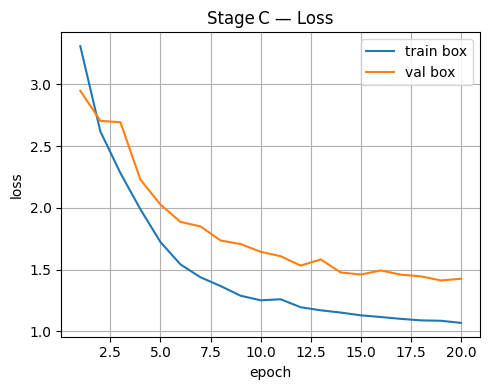

In [15]:
plt.figure(figsize=(5,4))
plt.plot(metrics["epoch"], metrics["train/box_loss"], label="train box")
if "val/box_loss" in metrics.columns:
    plt.plot(metrics["epoch"], metrics["val/box_loss"], label="val box")
plt.title("Stage C — Loss"); plt.xlabel("epoch"); plt.ylabel("loss")
plt.legend(); plt.grid(); plt.tight_layout(); plt.show()

if "metrics/mAP50-95" in metrics.columns:
    plt.figure(figsize=(5,4))
    plt.plot(metrics["epoch"], metrics["metrics/mAP50-95"], marker='o')
    plt.title("Stage C — mAP@50‑95"); plt.xlabel("epoch"); plt.ylabel("mAP")
    plt.grid(); plt.tight_layout(); plt.show()


In [ ]:
import shutil
best_model_path = "runs/detect/C_EffViT_head_only2/weights/best.pt"
final_save_path = "/content/yolo_stageC_efficientvit_head.pt"
shutil.copy(best_model_path, final_save_path)

print("✓ Stage C model saved as:", final_save_path)


✓ Stage C model saved as: /content/yolo_stageC_efficientvit_head.pt


visualise final models predictions with bounding boxes

 Found 900 validation images for evaluation.
 Selected 40 images with fire/smoke detections.


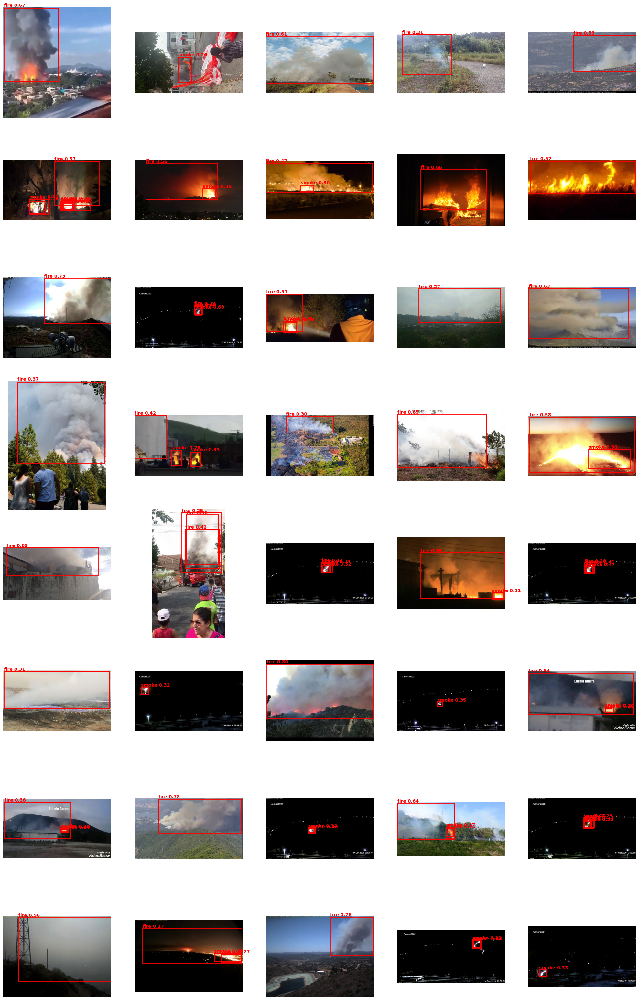

In [ ]:

import glob
import os
import cv2
import math
import torch
import matplotlib.pyplot as plt
from ultralytics import YOLO

yolo = YOLO('/content/yolo_stageC_efficientvit_head.pt')

id2name = yolo.names  


val_image_dir = '/content/dataset/images/test'
val_image_paths = glob.glob(f"{val_image_dir}/*.*")

print(f" Found {len(val_image_paths)} validation images for evaluation.")


results = yolo.predict(
    source=val_image_paths,
    imgsz=224,
    conf=0.25,
    save=False,
    device='cuda' if torch.cuda.is_available() else 'cpu',
    verbose=False
)

selected = [
    (img_path, res)
    for img_path, res in zip(val_image_paths, results)
    if any(id2name[int(cls)] in ('fire', 'smoke') for cls in res.boxes.cls)
][:40]

print(f" Selected {len(selected)} images with fire/smoke detections.")


cols = 5
rows = math.ceil(len(selected) / cols)
plt.figure(figsize=(20, rows * 4))

for i, (img_path, res) in enumerate(selected):
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    ax = plt.subplot(rows, cols, i + 1)
    ax.imshow(img)


    for box, cls_id, conf in zip(res.boxes.xyxy, res.boxes.cls, res.boxes.conf):
        label = id2name[int(cls_id)]
        if label not in ('fire', 'smoke'):
            continue

        x1, y1, x2, y2 = map(int, box.tolist())
        ax.add_patch(plt.Rectangle(
            (x1, y1), x2 - x1, y2 - y1,
            edgecolor='red', linewidth=2, fill=False
        ))
        ax.text(x1, y1 - 5, f'{label} {conf:.2f}', color='red',
                fontsize=10, weight='bold')

    ax.set_title("", fontsize=9)
    ax.axis('off')

plt.tight_layout()
plt.show()


visualise heatmaps from extracted vectors

DELETEING THIS BLOCK OVER SIZE ISSUES WITH UPLOADING, SPOKE TO SAAD TA


BLIP caption generation and prediction visualisation

classwise predictions with captions

 Loaded 900 validation images.


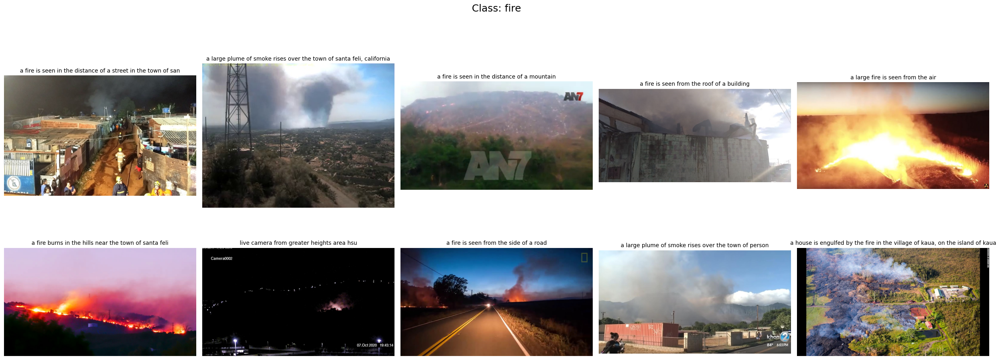

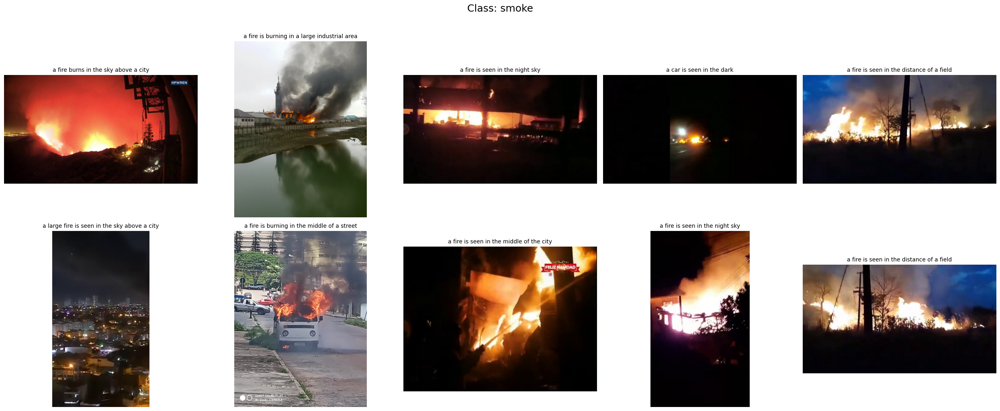

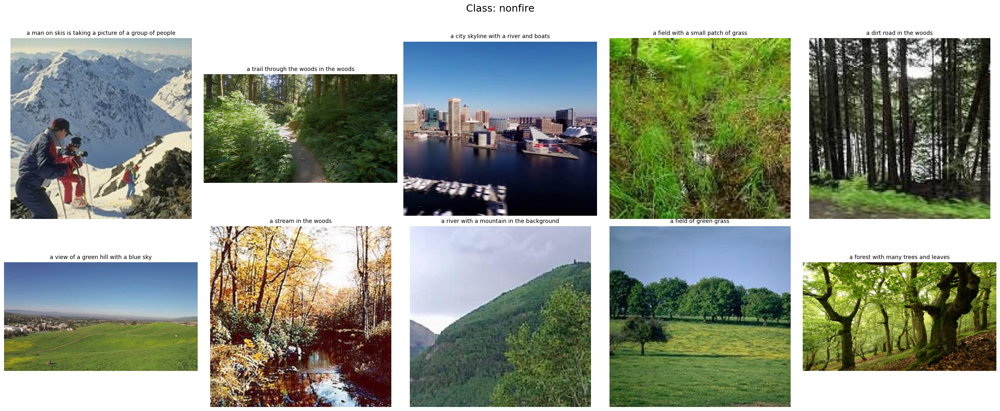

In [ ]:


device = "cuda" if torch.cuda.is_available() else "cpu"

yolo = YOLO("/content/yolo_stageC_efficientvit_head.pt")
id2name = yolo.names  
vit = yolo.model.model[0].to(device)

layer_index = 2

test_input = torch.randn(1, 3, 224, 224).to(device)
vit.eval()
with torch.no_grad():
    features = vit(test_input)
    feature_dim = features.shape[1]

projector = torch.nn.Linear(feature_dim, 512).to(device)

blip_processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
blip_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device)

blip_preprocess = T.Compose([
    T.Resize((384, 384)),
    T.ToTensor()
])

tinyvit_preprocess = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor()
])

val_image_paths = glob("/content/dataset/images/test/*.*")
assert len(val_image_paths) > 0, " No validation images found!"

print(f" Loaded {len(val_image_paths)} validation images.")

results = yolo.predict(
    source=val_image_paths,
    imgsz=224,
    conf=0.25,
    save=False,
    device=device,
    verbose=False
)


class_images = {"fire": [], "smoke": [], "nonfire": []}

for path, res in zip(val_image_paths, results):
    if len(res.boxes.cls) > 0:
        classes = [int(cls) for cls in res.boxes.cls]
        majority_class = max(set(classes), key=classes.count)
        label = id2name[majority_class]
        if label in class_images:
            class_images[label].append(path)

def extract_feature_vector(image_tensor, vit_model, layer_index=2):
    vit_model.eval()
    with torch.no_grad():
        features = vit_model(image_tensor)
        if isinstance(features, (list, tuple)):
            features = features[layer_index]
        pooled = torch.mean(features, dim=[2, 3])
    return pooled

def display_class_images(image_list, class_title):
    n = min(len(image_list), 10)
    if n == 0:
        print(f" No confident images for class: {class_title}")
        return

    cols = 5
    rows = (n + cols - 1) // cols
    plt.figure(figsize=(cols * 5, rows * 5))

    selected = random.sample(image_list, n)

    for i, img_path in enumerate(selected):
        image = Image.open(img_path).convert("RGB")

        blip_inputs = blip_processor(image, return_tensors="pt").to(device)
        with torch.no_grad():
            out = blip_model.generate(**blip_inputs)
        caption = blip_processor.decode(out[0], skip_special_tokens=True)

        img_tensor = tinyvit_preprocess(image).unsqueeze(0).to(device)
        with torch.no_grad():
            feature_vec = extract_feature_vector(img_tensor, vit, layer_index)
            projected_vec = projector(feature_vec)
            projected_vec /= projected_vec.norm(dim=-1, keepdim=True)


        plt.subplot(rows, cols, i + 1)
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"{caption}", fontsize=10)

    plt.suptitle(f"Class: {class_title}", fontsize=18, y=1.02)
    plt.tight_layout()
    plt.show()

for cls_name, img_list in class_images.items():
    if len(img_list) > 0:
        display_class_images(img_list, cls_name)
    else:
        print(f" No images found for class: {cls_name}")
